## Dataset Description

The data set includes information about:

- Customers who left within the last month – the column is called Churn
- Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
- Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
- Demographic info about customers – gender, age range, and if they have partners and dependents

Each row represents a customer, and each column represents customer attributes as described below.

| Column | Description|
|-|-|
|gender|Whether the customer is a male or a female|
|SeniorCitizen| Whether the customer is a senior citizen or not (1, 0)|
|Partner|Whether the customer has a partner or not (Yes, No)|
|Dependents|Whether the customer has dependents or not (Yes, No)|
|tenure| Number of months the customer has stayed with the company|
|PhoneService|Whether the customer has a phone service or not (Yes, No)|
|MultipleLines|Whether the customer has multiple lines or not (Yes, No, No phone service*)|
|InternetService|Customer’s internet service provider (DSL, Fiber optic, No)|
|OnlineSecurity|Whether the customer has online security or not (Yes, No, No internet service**)|
|OnlineBackup|Whether the customer has online backup or not (Yes, No, No internet service)|
|DeviceProtection|Whether the customer has device protection or not (Yes, No, No internet service)|
|TechSupport|Whether the customer has tech support or not (Yes, No, No internet service)|
|StreamingTV|Whether the customer has streaming TV or not (Yes, No, No internet service) |
|StreamingMovies|Whether the customer has streaming movies or not (Yes, No, No internet service)|
|Contract|The contract term of the customer (Month-to-month, One year, Two year)|
|PaperlessBilling|Whether the customer has paperless billing or not (Yes, No)|
|PaymentMethod|The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))|
|MonthlyCharges|The amount charged to the customer monthly|
|TotalCharges|The total amount charged to the customer|
|Churn|Whether the customer churned or not (Yes or No)|

\* No phone service means the customer's plan does not include calling (could be a data-only plan)

\*\* No internet service means the customer's plan does not include internet/data and so the addon package does not apply

## Importing Libraries & Dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import math
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import graphviz
from sklearn.tree import export_graphviz
import statistics
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

%matplotlib inline

df = pd.read_csv('https://raw.githubusercontent.com/NadaBakeer/selectedProjects/main/data/telecom_churn.csv')

df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$29.85/m,$29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,$56.95/m,$1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,$53.85/m,$108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),$42.3/m,$1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$70.7/m,$151.65,Yes


## Data Inspection

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        6976 non-null   object
 1   gender            7032 non-null   object
 2   SeniorCitizen     7032 non-null   int64 
 3   Partner           7032 non-null   object
 4   Dependents        7032 non-null   object
 5   tenure            7032 non-null   int64 
 6   PhoneService      7032 non-null   object
 7   MultipleLines     7032 non-null   object
 8   InternetService   7032 non-null   object
 9   OnlineSecurity    7032 non-null   object
 10  OnlineBackup      7032 non-null   object
 11  DeviceProtection  7032 non-null   object
 12  TechSupport       7032 non-null   object
 13  StreamingTV       7032 non-null   object
 14  StreamingMovies   7032 non-null   object
 15  Contract          7032 non-null   object
 16  PaperlessBilling  7032 non-null   object
 17  PaymentMethod 

In [ ]:
df.isnull().sum()

,0
customerID,56
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
tenure,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


In [ ]:
df.describe(include='all')

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
count,6976,7032,7032.000000,7032,7032,7032.000000,7032,7032,7032,7032,...,7032,7032,7032,7032,7032,7032,7032,7032,6180,7032
unique,6976,2,NaN,2,2,NaN,2,3,3,3,...,3,3,3,3,3,2,4,1584,5783,2
top,7590-VHVEG,Male,NaN,No,No,NaN,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,$20.05/m,$20.2,No
freq,1,3549,NaN,3639,4933,NaN,6352,3385,3096,3497,...,3094,3472,2809,2781,3875,4168,2365,61,8,5163
mean,NaN,NaN,0.162400,NaN,NaN,32.421786,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.368844,NaN,NaN,24.545260,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,0.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,0.000000,NaN,NaN,9.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,0.000000,NaN,NaN,29.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,0.000000,NaN,NaN,55.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data Cleaning



In [ ]:
#Removed '$'sign from MonthlyCharges and TotalCharges coloumn, and removed '/m' from MonthlyCharges in order to change their data type to float
df['TotalCharges'] = df['TotalCharges'].str.extract('([0.0-9.9]+)', expand=False).str.strip()
df['MonthlyCharges'] = df['MonthlyCharges'].str.extract('([0.0-9.9]+)', expand=False).str.strip()

In [ ]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.3,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.7,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7027,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.8,1990.5,No
7028,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.2,7362.9,No
7029,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.6,346.45,No
7030,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.4,306.6,Yes


In [ ]:
#Changed the datatype of TotalCharges and MonthlyCharges to float
df['TotalCharges']=df['TotalCharges'].astype(float)
df['MonthlyCharges']=df['MonthlyCharges'].astype(float)

In [ ]:
#Changed the TotalCharges, MonthlyCharges, and tenure column names to be more descriptive
df.rename(columns={'TotalCharges': 'TotalCharges in USD'}, inplace=True)
df.rename(columns={'MonthlyCharges': 'MonthlyCharges in USD/mth'}, inplace=True)
df.rename(columns={'tenure': 'Tenure per mth'}, inplace=True)

In [ ]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,Tenure per mth,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges in USD/mth,TotalCharges in USD,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7027,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7028,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7029,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7030,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [ ]:
#Checking the percentage of null values in attributes
percentMissing = df.isnull().sum()/len(df)
percentMissing

,0
customerID,0.007964
gender,0.000000
SeniorCitizen,0.000000
Partner,0.000000
Dependents,0.000000
Tenure per mth,0.000000
PhoneService,0.000000
MultipleLines,0.000000
InternetService,0.000000
OnlineSecurity,0.000000


In [ ]:
#Replacing the null values in total charges with the product of tenure and monthly charges, since tenure is the number of months the customer has stayed with the company
# and monthly charges represent the charges imposed per month
j = 0
for charge in df['TotalCharges in USD']:
  if math.isnan(charge) == True:
    Tenure = df.iloc[j]['Tenure per mth']
    MonthlyCharges = df.iloc[j]['MonthlyCharges in USD/mth']
    Value = Tenure*MonthlyCharges
    df.loc[j,'TotalCharges in USD'] = Value
  j = j + 1

In [ ]:
#Null values in monthly charges replaced successfully
df.isnull().sum()

,0
customerID,56
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
Tenure per mth,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


In [ ]:
#Handled the null values in customerID by dropping the column since it won't affect the customer churn in any way
df = df.drop(['customerID'], axis=1)

In [ ]:
#Data has no more null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   gender                     7032 non-null   object 
 1   SeniorCitizen              7032 non-null   int64  
 2   Partner                    7032 non-null   object 
 3   Dependents                 7032 non-null   object 
 4   Tenure per mth             7032 non-null   int64  
 5   PhoneService               7032 non-null   object 
 6   MultipleLines              7032 non-null   object 
 7   InternetService            7032 non-null   object 
 8   OnlineSecurity             7032 non-null   object 
 9   OnlineBackup               7032 non-null   object 
 10  DeviceProtection           7032 non-null   object 
 11  TechSupport                7032 non-null   object 
 12  StreamingTV                7032 non-null   object 
 13  StreamingMovies            7032 non-null   objec

## Exploratory Data Analysis

**Visualization**

**Q1: What are the most correlated attributes with customer churn?**

In [ ]:
#One Hot Encoding
#Encoded all the attributes to visualize the data, and chose one-hot encoding to find the correlation between churn and all other attributes also these attributes have a low number of categories
categorical_columns = ['gender', 'SeniorCitizen', 'Partner','Dependents', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity','OnlineBackup', 'DeviceProtection',
                       'TechSupport', 'StreamingTV', 'StreamingMovies','Contract', 'PaperlessBilling', 'PaymentMethod','Churn']
df_encode = pd.get_dummies(data=df,
                           columns=categorical_columns,
                           drop_first=False,
                           dtype='int8')

**Visualization**

In [ ]:
#Attributes encoded successfully
df_encode.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 48 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Tenure per mth                           7032 non-null   int64  
 1   MonthlyCharges in USD/mth                7032 non-null   float64
 2   TotalCharges in USD                      7032 non-null   float64
 3   gender_Female                            7032 non-null   int8   
 4   gender_Male                              7032 non-null   int8   
 5   SeniorCitizen_0                          7032 non-null   int8   
 6   SeniorCitizen_1                          7032 non-null   int8   
 7   Partner_No                               7032 non-null   int8   
 8   Partner_Yes                              7032 non-null   int8   
 9   Dependents_No                            7032 non-null   int8   
 10  Dependents_Yes                           7032 no

In [ ]:
#Dropped one category from the binary attriubtes since including them would be redundant
df_encode=df_encode.drop(columns=['PaperlessBilling_No', 'Dependents_No','PhoneService_No','Partner_No','SeniorCitizen_0','gender_Male','Churn_No'], axis=1)

In [ ]:
#Checking the correlation between Churn and all other attributes
correlation=df_encode.corr()
correlation_output = correlation['Churn_Yes'].sort_values(ascending=False, key=lambda x: x.abs())
correlation_output

,Churn_Yes
Churn_Yes,1.000000
Contract_Month-to-month,0.404565
Tenure per mth,-0.354049
OnlineSecurity_No,0.342235
TechSupport_No,0.336877
InternetService_Fiber optic,0.307463
Contract_Two year,-0.301552
PaymentMethod_Electronic check,0.301455
OnlineBackup_No,0.267595
DeviceProtection_No,0.252056


In [ ]:
#Plotting the correlation using heat map
plt.figure(figsize = (150,90))
sns.set(font_scale = 3)
sns.heatmap(correlation, cmap = 'viridis', annot = True)

<Axes: >

**Answer for Q1**: The most correlated attributes with customer churn are contract, tenure per month, and online security

**Q2: Which payment method has the highest churn rate?**

In [ ]:
#One Hot Encoding in order to access payement methods categories and visualize correlation
categorical_columns = ['PaymentMethod','Churn']
df_encode = pd.get_dummies(data=df,
                           columns=categorical_columns,
                           drop_first=False,
                           dtype='int8')

In [ ]:
#Created a copy of the encoded data frame to work on it separately
temp = df_encode.copy()

In [ ]:
#Chose from the data frame the payment columns only since they're the only needed ones in this question
temp1 = temp[['PaymentMethod_Electronic check', 'PaymentMethod_Credit card (automatic)', 'PaymentMethod_Bank transfer (automatic)', 'PaymentMethod_Mailed check', 'Churn_Yes']]
temp1

,PaymentMethod_Electronic check,PaymentMethod_Credit card (automatic),PaymentMethod_Bank transfer (automatic),PaymentMethod_Mailed check,Churn_Yes
0,1,0,0,0,0
1,0,0,0,1,0
2,0,0,0,1,1
3,0,0,1,0,0
4,1,0,0,0,1
...,...,...,...,...,...
7027,0,0,0,1,0
7028,0,1,0,0,0
7029,1,0,0,0,0
7030,0,0,0,1,1


In [ ]:
#Checking the correlation between Churn and Payment methods
correlation=temp1.corr()
correlation_output = correlation['Churn_Yes'].sort_values(ascending=False, key=lambda x: x.abs())
correlation_output

,Churn_Yes
Churn_Yes,1.000000
PaymentMethod_Electronic check,0.301455
PaymentMethod_Credit card (automatic),-0.134687
PaymentMethod_Bank transfer (automatic),-0.118136
PaymentMethod_Mailed check,-0.090773


<Axes: >

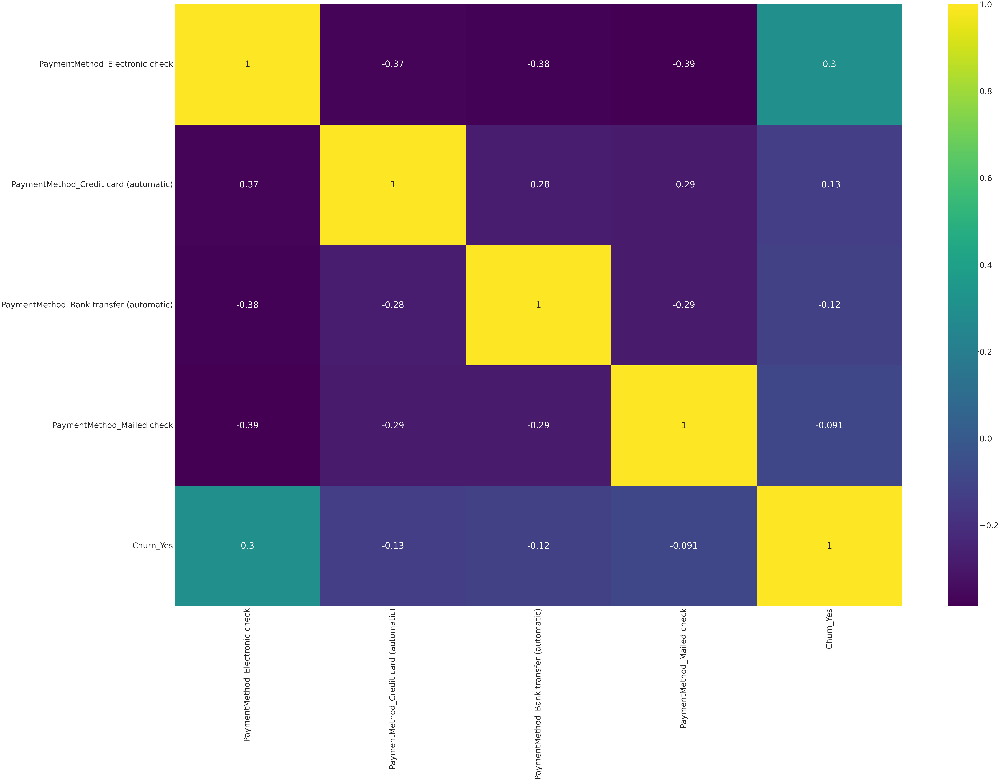

In [ ]:
#Plotting the correlation using heat map
plt.figure(figsize = (90,60))
sns.set(font_scale = 4)
sns.heatmap(correlation, cmap = 'viridis', annot = True)

In [ ]:
temp1.head()

,PaymentMethod_Electronic check,PaymentMethod_Credit card (automatic),PaymentMethod_Bank transfer (automatic),PaymentMethod_Mailed check,Churn_Yes
0,1,0,0,0,0
1,0,0,0,1,0
2,0,0,0,1,1
3,0,0,1,0,0
4,1,0,0,0,1


In [ ]:
# removed all 0s in churn_yes in order to visualize against churn_yes=1 only
temp1=temp1[temp1["Churn_Yes"] == 1]
temp1.reset_index(drop=True, inplace= True)

In [ ]:
# removed 0s from churn_yes successfully
temp1.head()

,PaymentMethod_Electronic check,PaymentMethod_Credit card (automatic),PaymentMethod_Bank transfer (automatic),PaymentMethod_Mailed check,Churn_Yes
0,0,0,0,1,1
1,1,0,0,0,1
2,1,0,0,0,1
3,1,0,0,0,1
4,0,0,1,0,1


In [ ]:
# Getting number of 1's in each payment method column to visualize 1's of payment methods
print(temp1['PaymentMethod_Electronic check'].value_counts())
print(temp1['PaymentMethod_Credit card (automatic)'].value_counts())
print(temp1['PaymentMethod_Bank transfer (automatic)'].value_counts())
print(temp1['PaymentMethod_Mailed check'].value_counts())

PaymentMethod_Electronic check
1    1071
0     798
Name: count, dtype: int64
PaymentMethod_Credit card (automatic)
0    1637
1     232
Name: count, dtype: int64
PaymentMethod_Bank transfer (automatic)
0    1611
1     258
Name: count, dtype: int64
PaymentMethod_Mailed check
0    1561
1     308
Name: count, dtype: int64


<BarContainer object of 4 artists>

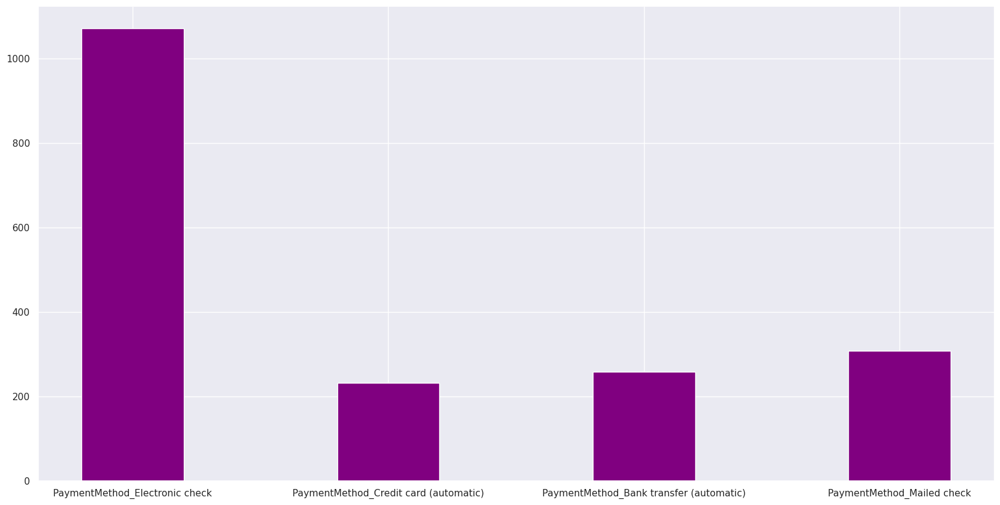

In [ ]:
# plotting bar plot to show which payement method has the highest churn rate
data = {'PaymentMethod_Electronic check':1071, 'PaymentMethod_Credit card (automatic)':232, 'PaymentMethod_Bank transfer (automatic)':258,
        'PaymentMethod_Mailed check':308}
payement_methods = list(data.keys())
count_of_1s = list(data.values())
sns.set(font_scale=1)
fig = plt.figure(figsize = (20, 10))

plt.bar(payement_methods, count_of_1s, color ='purple',
        width = 0.4)



**Answer for Q2**: Based on Churn_yes, the Payment method Electronic

---

check since it has the highest positive correlation with the customer churn (0.3). Also, according to the barplot which is based on the counts of 1s in the payement method against churn_yes=1, Payment method Electronic check has the highest numver of churned customers

**Q3: After how many months do customers commonly churn?**  (Hint: show and interpret the distribution at 25%,
50% and 75%)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   gender                     7032 non-null   object 
 1   SeniorCitizen              7032 non-null   int64  
 2   Partner                    7032 non-null   object 
 3   Dependents                 7032 non-null   object 
 4   Tenure per mth             7032 non-null   int64  
 5   PhoneService               7032 non-null   object 
 6   MultipleLines              7032 non-null   object 
 7   InternetService            7032 non-null   object 
 8   OnlineSecurity             7032 non-null   object 
 9   OnlineBackup               7032 non-null   object 
 10  DeviceProtection           7032 non-null   object 
 11  TechSupport                7032 non-null   object 
 12  StreamingTV                7032 non-null   object 
 13  StreamingMovies            7032 non-null   objec

In [ ]:
#Created a copy of the encoded data frame to work on it separately and chose only tenure per month and churn columns since they are the only needed ones
temp2 = temp[['Tenure per mth', 'Churn_Yes']]
temp2

,Tenure per mth,Churn_Yes
0,1,0
1,34,0
2,2,1
3,45,0
4,2,1
...,...,...
7027,24,0
7028,72,0
7029,11,0
7030,4,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   gender                     7032 non-null   object 
 1   SeniorCitizen              7032 non-null   int64  
 2   Partner                    7032 non-null   object 
 3   Dependents                 7032 non-null   object 
 4   Tenure per mth             7032 non-null   int64  
 5   PhoneService               7032 non-null   object 
 6   MultipleLines              7032 non-null   object 
 7   InternetService            7032 non-null   object 
 8   OnlineSecurity             7032 non-null   object 
 9   OnlineBackup               7032 non-null   object 
 10  DeviceProtection           7032 non-null   object 
 11  TechSupport                7032 non-null   object 
 12  StreamingTV                7032 non-null   object 
 13  StreamingMovies            7032 non-null   objec

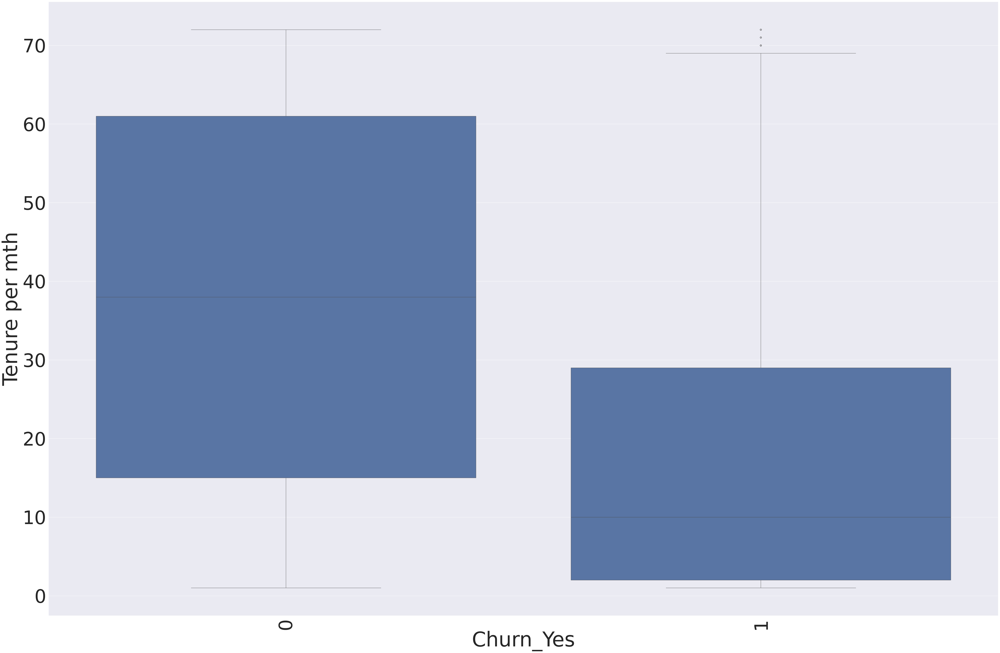

In [ ]:
#Plotting the box plot for churn_yes aganist tenure per month
sns.set(font_scale=7)
plt.figure(figsize=(60,40))
sns.boxplot(x='Churn_Yes', y='Tenure per mth', data=temp2);
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
temp2.head()

,Tenure per mth,Churn_Yes
0,1,0
1,34,0
2,2,1
3,45,0
4,2,1


In [ ]:
#Removing all the 0 values from churn_yes (Customer who didn't churn) to be able to visualize the only churned customers
temp2_encode=temp2[temp2["Churn_Yes"] == 1]
temp2_encode.reset_index(drop=True, inplace= True)

In [ ]:
# 0's removed from column churn_yes successfully
temp2_encode.head()

,Tenure per mth,Churn_Yes
0,2,1
1,2,1
2,8,1
3,28,1
4,49,1


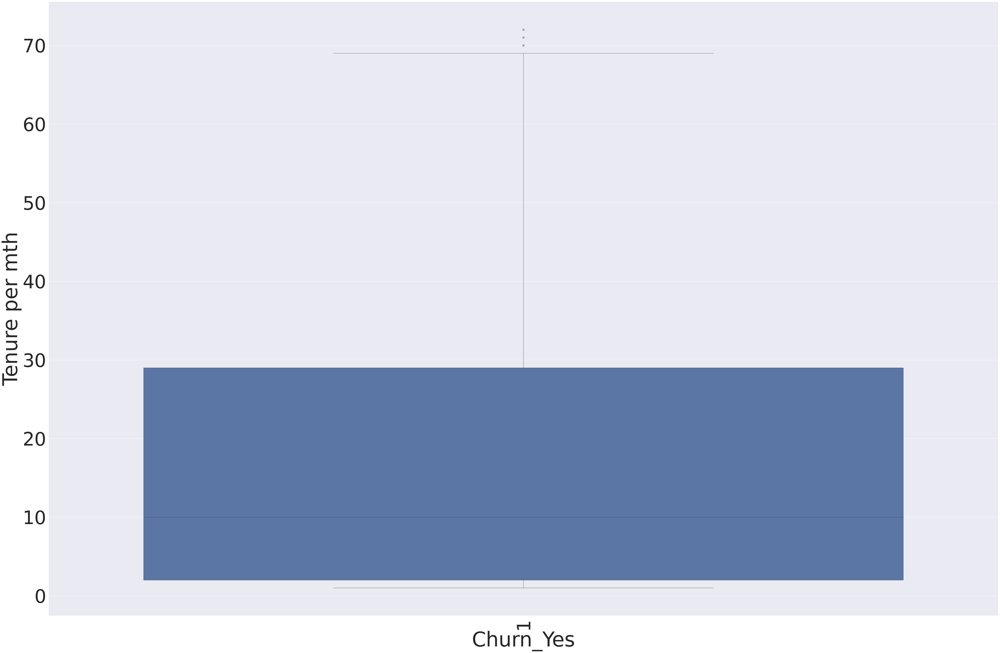

In [ ]:
#Visualizing the box plot again but with the customers who have a churn value of 1 only
sns.set(font_scale=7)
plt.figure(figsize=(60,40))
sns.boxplot(x='Churn_Yes', y='Tenure per mth', data=temp2_encode);
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
#Removing outliers using quantile(0.99) function
q = temp2_encode["Tenure per mth"].quantile(0.99)
q

70.0

In [ ]:
#Removing outliers
original_length = len(temp2_encode)
print(f'{len(temp2_encode[temp2_encode["Tenure per mth"] > q])} rows removed')

temp2_encode2 = temp2_encode[temp2_encode["Tenure per mth"] < q]
temp2_encode2.reset_index(drop = True, inplace = True)

12 rows removed


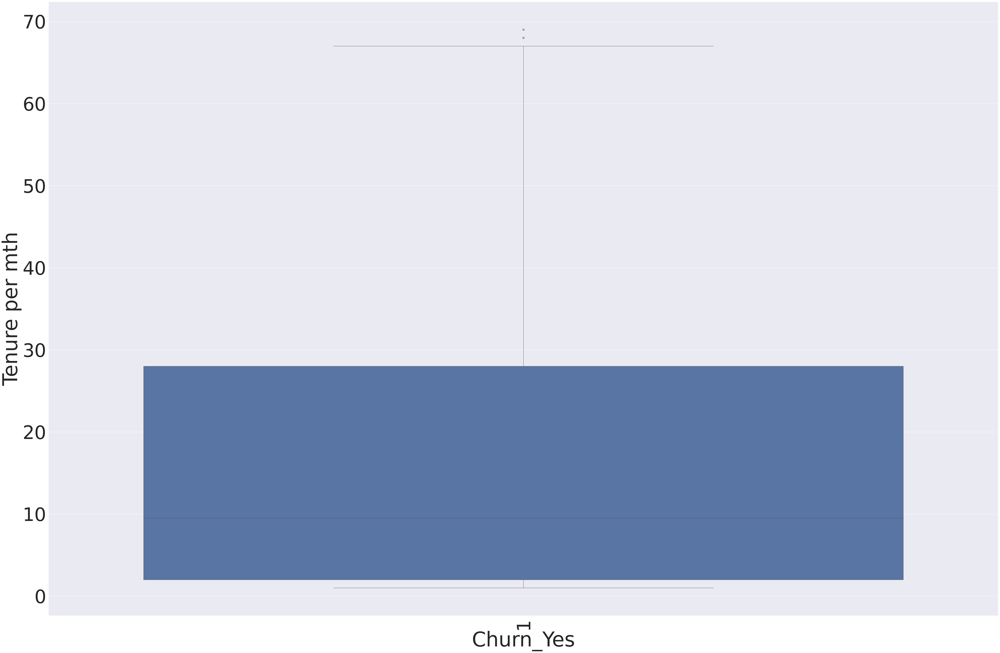

In [ ]:
#Plotting the box plot without outliers
sns.set(font_scale=7)
plt.figure(figsize=(60,40))
sns.boxplot(x='Churn_Yes', y='Tenure per mth',data=temp2_encode2);
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
#Calculating the quantile values
temp2_encode2['Tenure per mth'].quantile([0.25,0.5,0.75])


,Tenure per mth
0.25,2.0
0.50,9.5
0.75,28.0


In [ ]:
#Calculating the mean of tenure per month
mean = statistics.mean(temp2_encode2['Tenure per mth'])

In [ ]:
temp2_encode2["Tenure per mth"].mean()

17.321235102925243

In [ ]:
#Visualizing the quantiles of tenure per month using violin plot
fig = px.violin(temp2_encode2, y="Tenure per mth", box=True, # draw box plot inside the violin
               points='all',
               )
fig.show()

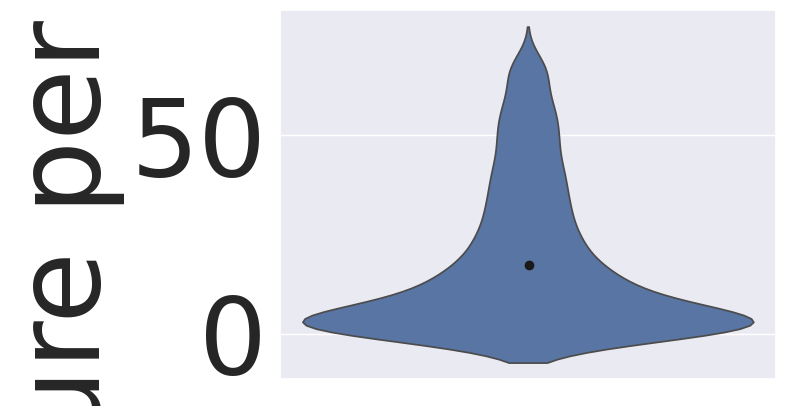

In [ ]:
#Visualizing the mean of tenure per month using violin plot
sns.violinplot(data=temp2_encode2, y="Tenure per mth",
                inner = None,
               )
sns.set(font_scale=4)
plt.scatter(x=0.002, y=temp2_encode2["Tenure per mth"].mean(), c ="k")

**Answer for Q3**: 25% of customers churn after 2 months. While 50% churn after 9.5 months, lastly 75% churn after 28 months. Customers commonly churn after approximately 17 months, there's a differnece of 11 months between 50% and mean as the dataset is skewed thus not a perfect alignment

## Data Preparation for Modelling

In [ ]:
df_modelling = df.copy()

In [ ]:
#One Hot Encoding
#Encoded those variables to be able to find the correlation between them and the churn
categorical_columns = ['gender', 'SeniorCitizen', 'Partner','Dependents', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'DeviceProtection',
                       'TechSupport', 'StreamingTV', 'StreamingMovies','PaperlessBilling', 'OnlineSecurity', 'PaymentMethod','Churn','OnlineBackup']
df_modelling_encode = pd.get_dummies(data=df_modelling,
                           columns=categorical_columns,
                           drop_first=False,
                           dtype='int8')

In [ ]:
# label encoding for contract, since its an ordinal attribute, as if a customer who subscribed for example two year would be less likely to churn,
# unlike those who subscribed for one month
df_modelling_encode['Contract'] = pd.Categorical(df_modelling_encode['Contract'],
                                                 categories=['Month-to-month','One year','Two year'],
                                                 ordered = True)
df_modelling_encode['Contract'] = df_modelling_encode['Contract'].astype('category').cat.codes


In [ ]:
df_modelling_encode

,Tenure per mth,Contract,MonthlyCharges in USD/mth,TotalCharges in USD,gender_Female,gender_Male,SeniorCitizen_0,SeniorCitizen_1,Partner_No,Partner_Yes,...,OnlineSecurity_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_No,Churn_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes
0,1,0,29.85,29.85,1,0,1,0,0,1,...,0,0,0,1,0,1,0,0,0,1
1,34,1,56.95,1889.50,0,1,1,0,1,0,...,1,0,0,0,1,1,0,1,0,0
2,2,0,53.85,108.15,0,1,1,0,1,0,...,1,0,0,0,1,0,1,0,0,1
3,45,1,42.30,1840.75,0,1,1,0,1,0,...,1,1,0,0,0,1,0,1,0,0
4,2,0,70.70,151.65,1,0,1,0,1,0,...,0,0,0,1,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7027,24,1,84.80,1990.50,0,1,1,0,0,1,...,1,0,0,0,1,1,0,1,0,0
7028,72,1,103.20,7362.90,1,0,1,0,0,1,...,0,0,1,0,0,1,0,0,0,1
7029,11,0,29.60,346.45,1,0,1,0,0,1,...,1,0,0,1,0,1,0,1,0,0
7030,4,0,74.40,306.60,0,1,0,1,0,1,...,0,0,0,0,1,0,1,1,0,0


In [ ]:
#Normalizing float variables in order to make the ranges of attributes more comparable by reducing the ranges
numerical_columns = ['MonthlyCharges in USD/mth', 'TotalCharges in USD']


df_modelling_encode[numerical_columns] = (

    df_modelling_encode[numerical_columns] - df_modelling_encode[numerical_columns].min()

) /(

    df_modelling_encode[numerical_columns].max() - df_modelling_encode[numerical_columns].min()
)


df_modelling_encode.head()

,Tenure per mth,Contract,MonthlyCharges in USD/mth,TotalCharges in USD,gender_Female,gender_Male,SeniorCitizen_0,SeniorCitizen_1,Partner_No,Partner_Yes,...,OnlineSecurity_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn_No,Churn_Yes,OnlineBackup_No,OnlineBackup_No internet service,OnlineBackup_Yes
0,1,0,0.115423,0.001275,1,0,1,0,0,1,...,0,0,0,1,0,1,0,0,0,1
1,34,1,0.385075,0.215867,0,1,1,0,1,0,...,1,0,0,0,1,1,0,1,0,0
2,2,0,0.354229,0.010310,0,1,1,0,1,0,...,1,0,0,0,1,0,1,0,0,1
3,45,1,0.239303,0.210241,0,1,1,0,1,0,...,1,1,0,0,0,1,0,1,0,0
4,2,0,0.521891,0.015330,1,0,1,0,1,0,...,0,0,0,1,0,0,1,1,0,0


In [ ]:
#Checking the correlation between all attributes and churn attributes to see which ones will be included in the model
correlation=df_modelling_encode.corr()
correlation_output = correlation['Churn_Yes'].sort_values(ascending=False, key=lambda x: x.abs())
correlation_output

,Churn_Yes
Churn_No,-1.000000
Churn_Yes,1.000000
Contract,-0.396150
Tenure per mth,-0.354049
OnlineSecurity_No,0.342235
OnlineSecurity_No,0.342235
TechSupport_No,0.336877
InternetService_Fiber optic,0.307463
PaymentMethod_Electronic check,0.301455
OnlineBackup_No,0.267595


## Modelling

In [ ]:
# 1- Dropped columns with correlation less than or equalto 0.1, however kept some as logically they are correlated (TotalCharges in USD)
# 2- Monthly charges is included in the total charges, so including it in the model would be redundant.
x=df_modelling_encode.drop(columns=['PaperlessBilling_No','PaperlessBilling_Yes', 'MonthlyCharges in USD/mth','Dependents_Yes', 'Dependents_No','PhoneService_Yes',
                                    'PhoneService_No','MultipleLines_No phone service','MultipleLines_No','MultipleLines_Yes','Partner_No','Partner_Yes','SeniorCitizen_1',
                                    'SeniorCitizen_0','gender_Female','gender_Male','Churn_Yes','Churn_No'], axis=1)
y = df_modelling_encode['Churn_Yes'] # Dependent variable
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=23)

print('Training dataset size:', x_train.shape[0])
print('Testing dataset size:', x_test.shape[0])

Training dataset size: 5625
Testing dataset size: 1407


In [ ]:
#Creating the model then training the model
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(x_train, y_train)

DecisionTreeClassifier(random_state=42)

### Tree Visualization

In [ ]:
#Visualizing the tree
dot_data = export_graphviz(tree_clf, out_file=None,
                           feature_names=x.columns,
                           class_names=['No', 'Yes'],
                           filled=True, rounded=True,
                           special_characters=True)

graph = graphviz.Source(dot_data)
graph

Contract ≤ 0.5(false)  -->
InternetService_Fiber optic ≤ 0.5(true)  -->
OnlineSecurity_No ≤ 0.5(true)  -->
Contract ≤ 1.5 (false)  -->
TotalCharges in USD ≤ 0.766(false)  -->
TotalCharges in USD ≤ 0.767 (true)  -->
Class= yes

First off, if the Contract is more than 0.5 , and InternetService_Fiber optic is less than or equal to 0.5, then check OnlineSecurity_No whether it's also less than or equal 0.5 if true, then check Contract to be more than 1.5 and TotalCharges in USD is more then 0.766 yet less than 0.767. Consequently the predicted class is "Yes".

## Evaluation

In [ ]:
def print_score(clf, x_train, y_train, x_test, y_test, train=True):
    if train:
        pred = clf.predict(x_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")

    elif train==False:
        pred = clf.predict(x_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [ ]:
print_score(tree_clf, x_train, y_train, x_test, y_test, train=True)
print_score(tree_clf, x_train, y_train, x_test, y_test, train=False)

Train Result:
Accuracy Score: 99.45%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy    macro avg  weighted avg
precision     0.994239     0.995202  0.994489     0.994721      0.994492
recall        0.998313     0.983740  0.994489     0.991026      0.994489
f1-score      0.996272     0.989438  0.994489     0.992855      0.994479
support    4149.000000  1476.000000  0.994489  5625.000000   5625.000000
_______________________________________________
Confusion Matrix: 
 [[4142    7]
 [  24 1452]]

Test Result:
Accuracy Score: 73.77%
_______________________________________________
CLASSIFICATION REPORT:
                     0           1  accuracy    macro avg  weighted avg
precision     0.815249    0.531250   0.73774     0.673250      0.735923
recall        0.822485    0.519084   0.73774     0.670785      0.737740
f1-score      0.818851    0.525097   0.73774     0.671974      0.736800
support    1014.000000  393.000000  

In [ ]:
#Plotting confusion matrix
cm = confusion_matrix(y_test, tree_clf.predict(x_test), normalize='true') # Calculate the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=tree_clf.classes_)

In [ ]:
#Checking the precision value to know the ratio of correctly predicted positive observations to the total predicted positive observations
#Checking the recall value to know the ratio of correctly predicted positive observations to total actual positive observations
# The metrics to focus on should be either precision, recall or F1 score as they only take 1 class into consideration due to the class imbalnace and accurcacy should be ignoredas it takes both classes into consideration
pred = tree_clf.predict(x_test)

print('Precision: ',precision_score(y_test,pred))
print('=======================================')
print('Recall: ',recall_score(y_test,pred))
print('=======================================')
print('F1_score: ',f1_score(y_test,pred))

Precision:  0.53125
Recall:  0.5190839694656488
F1_score:  0.525096525096525


## Logistic Regression Model

In [ ]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 31 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Tenure per mth                           7032 non-null   int64  
 1   Contract                                 7032 non-null   int8   
 2   TotalCharges in USD                      7032 non-null   float64
 3   InternetService_DSL                      7032 non-null   int8   
 4   InternetService_Fiber optic              7032 non-null   int8   
 5   InternetService_No                       7032 non-null   int8   
 6   OnlineSecurity_No                        7032 non-null   int8   
 7   OnlineSecurity_No internet service       7032 non-null   int8   
 8   OnlineSecurity_Yes                       7032 non-null   int8   
 9   DeviceProtection_No                      7032 non-null   int8   
 10  DeviceProtection_No internet service     7032 no

In [ ]:
# Scaled the data to make the attributes' values lie in the same ranges to avoid domination of an attribute
sc_x = StandardScaler()
xtrain = sc_x.fit_transform(x_train)
xtest = sc_x.transform(x_test)

print (xtrain[0:5, :])

[[ 0.76681335  0.38796688  1.20150983 -0.71930488  1.12409141 -0.52681879
  -0.99062175 -0.52681879  1.5743774   1.12652568 -0.52681879 -0.72101283
  -0.98815899 -0.52681879  1.56960822 -0.82043357 -0.52681879  1.27612878
   1.23478169 -0.52681879 -0.79399923 -0.99062175 -0.52681879  1.5743774
  -0.52819547 -0.52158302 -0.71674573  1.83685274  1.13591789 -0.52681879
  -0.7275739 ]
 [ 1.37855731  0.38796688  2.29915493 -0.71930488  1.12409141 -0.52681879
   1.00946703 -0.52681879 -0.63517172 -0.88768505 -0.52681879  1.38693788
  -0.98815899 -0.52681879  1.56960822 -0.82043357 -0.52681879  1.27612878
  -0.80985976 -0.52681879  1.25944706  1.00946703 -0.52681879 -0.63517172
  -0.52819547 -0.52158302  1.39519493 -0.54440946 -0.88034532 -0.52681879
   1.37443082]
 [-0.04884526 -0.81906503  0.18714514 -0.71930488  1.12409141 -0.52681879
   1.00946703 -0.52681879 -0.63517172  1.12652568 -0.52681879 -0.72101283
   1.0119829  -0.52681879 -0.63710166 -0.82043357 -0.52681879  1.27612878
   1.2347

In [ ]:
#Creating the model then training the model
classifier = LogisticRegression(random_state = 0)
classifier.fit(x_train, y_train)

LogisticRegression(random_state=0)

In [ ]:
# Testing the model
y_pred = classifier.predict(x_test)

In [ ]:
# Checking the confusion matrix
#True positive values = 917, True negative values= 200
#False positive values = 97, False negative values = 193
cm = confusion_matrix(y_test, y_pred)

print ("Confusion Matrix : \n", cm)


Confusion Matrix : 
 [[917  97]
 [193 200]]


In [ ]:
# Checking accuracy score of the model, the accuracy score (79%) of the training dataset is high which indicates high accuracy prediction model.
# Logistic Regression model is recommended instead of decesion tree model as it provides higher accuracy although shoul have chaecked for multicollinearity.
print ("Accuracy : ", accuracy_score(y_test, y_pred))

Accuracy :  0.7938877043354655
